# Módulo de estatística 

## Projeto A - Análise do dataset "Wine Quality"

### Instruções

- O projeto deverá ser entregue até dia 22/11 antes do início da aula
- O projeto poderá ser feito em grupo com até 4 integrantes
- Serão 2 projetos A e B porém apenas 1 projeto deverá ser entregue e escolhido pelo grupo

- A entrega deve ser feita em jupyter notebook com os códigos explícitos e comentados. Além disso os conceitos, decisões e conclusões usadas devem estar destacadas no notebook
- A entrega pode ser feita pelo class ou no repositório do git de algum dos alunos

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality
    
Obs.: juntar os arquivos de vinho branco e tinto em um único dataframe

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

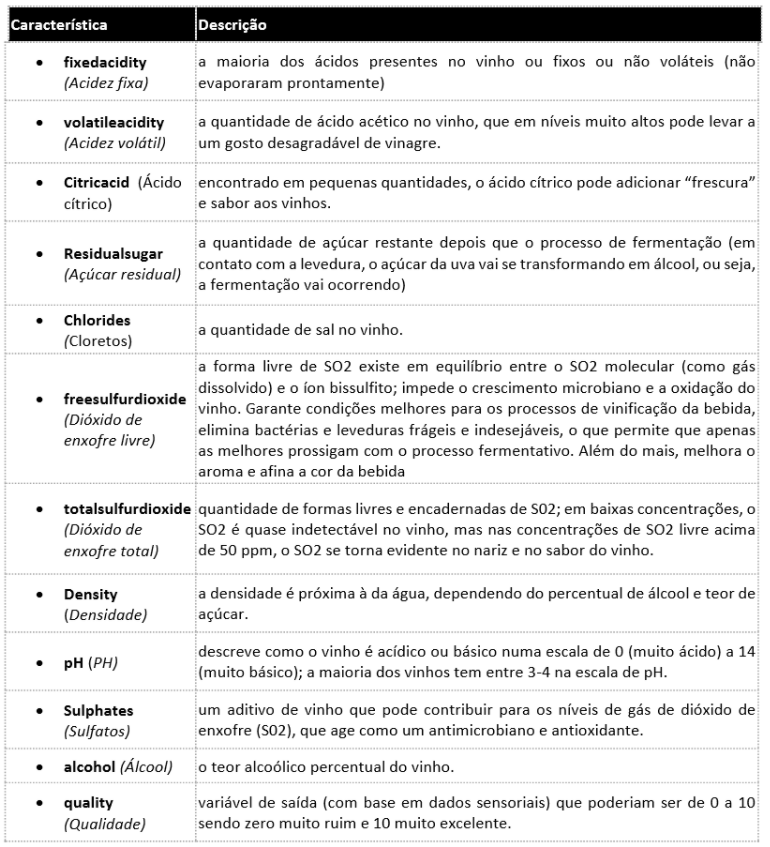

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)



### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

# Resolução

### ETAPA 1 - EDA - Análise Exploratória de Dados

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

# Import da biblioteca warnings para ignorar eventuais warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
red = pd.read_csv('C:/Users/ander/aulasletscode/Modulo4/Projeto/winequality-red.csv', sep=';')
white = pd.read_csv('C:/Users/ander/aulasletscode/Modulo4/Projeto/winequality-white.csv', sep=';')

In [3]:
vinho = pd.concat([red, white])

In [4]:
vinho.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
# Algumas estatísticas interessantes sobre o dataset
vinho.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [6]:
vinho.info() # OU df_car.dtypes ==> tipo de variável das colunas

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 659.9 KB


In [7]:
# criar uma coluna de identificação
vinho = vinho.reset_index()
vinho.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 6497 non-null   int64  
 1   fixed acidity         6497 non-null   float64
 2   volatile acidity      6497 non-null   float64
 3   citric acid           6497 non-null   float64
 4   residual sugar        6497 non-null   float64
 5   chlorides             6497 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6497 non-null   float64
 10  sulphates             6497 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [8]:
# criar uma coluna de identificação ID
vinho = vinho.rename(columns={"index":"ID"})
vinho.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    6497 non-null   int64  
 1   fixed acidity         6497 non-null   float64
 2   volatile acidity      6497 non-null   float64
 3   citric acid           6497 non-null   float64
 4   residual sugar        6497 non-null   float64
 5   chlorides             6497 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6497 non-null   float64
 10  sulphates             6497 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [9]:
vinho.head()

,ID,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [10]:
import plotly.express as px

In [11]:
# Por curiosidade, vamos ver como está a qualidade desses vinhos
vinho[['ID', 'quality']].sort_values(['quality'],ascending=False)

,ID,quality
2475,876,9
3204,1605,9
2426,827,9
2373,774,9
2419,820,9
...,...,...
3649,2050,3
1374,1374,3
4906,3307,3
1299,1299,3


In [12]:
fig = px.box(vinho, x="quality", points='all')
fig.show()

#### nota: a maioria dos vinhos estão entre as notas 4 e 7 de qualidade

<Figure size 864x576 with 0 Axes>

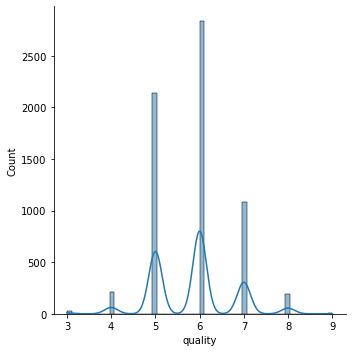

In [13]:
# uma olhada na distribuição conforme a qualidade do vinho ==> "quality"
plt.figure(figsize=(12,8))
sns.displot(vinho["quality"], kde=True)
plt.show()

In [14]:
vinho['quality'].value_counts() # qualidade dos vinhos & qtde

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

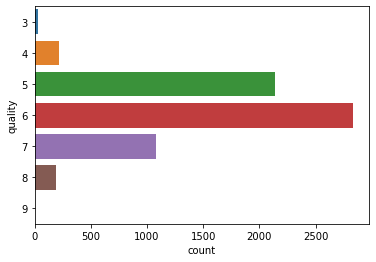

In [15]:
# de forma MAIS VISUAL (Gráfico)
sns.countplot(data=vinho,y='quality');

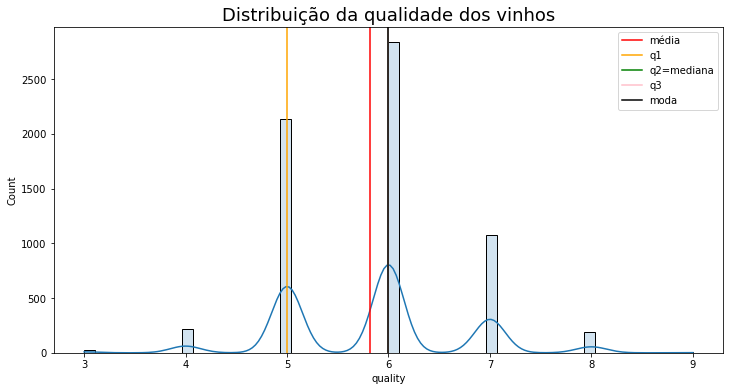

In [16]:
# Define o tamanho da figura
plt.figure(figsize=(12, 6))
# Define o Titulo
plt.title("Distribuição da qualidade dos vinhos", size=18)
# Plot do Histograma
sns.histplot(vinho["quality"], kde=True, alpha=0.2)
# plotando média
plt.axvline(x=vinho["quality"].mean(), color="red", label="média")
# plotando a mediana
plt.axvline(vinho["quality"].quantile(0.25), color="orange", label="q1")
plt.axvline(vinho["quality"].quantile(0.5), color="green", label="q2=mediana")
plt.axvline(vinho["quality"].quantile(0.75), color="pink", label="q3")
# Loop para plotar as modas
for i in range(vinho["quality"].mode().shape[0]):
    plt.axvline(vinho["quality"].mode()[i], color="black", label="moda")
# Cria uma legenda
plt.legend()
# Mostra o Gráfico
plt.show()

In [17]:
assimetria = vinho.skew()
assimetria

ID                      0.410419
fixed acidity           1.723290
volatile acidity        1.495097
citric acid             0.471731
residual sugar          1.435404
chlorides               5.399828
free sulfur dioxide     1.220066
total sulfur dioxide   -0.001177
density                 0.503602
pH                      0.386839
sulphates               1.797270
alcohol                 0.565718
quality                 0.189623
dtype: float64

#### nota2: Assimetria à direita, MENOS a 'total sulfur dioxide'

#### Amplitude, mínimo, máximo, variância, desvio padrão

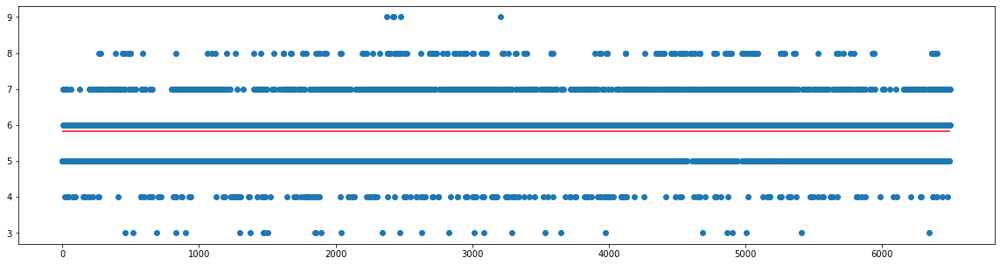

In [18]:
plt.figure(figsize=(20,5))
plt.scatter(range(vinho.shape[0]), vinho['quality'])
plt.hlines(vinho['quality'].mean(), xmin=0, xmax=vinho.shape[0], color='red')

In [19]:
print(vinho['quality'].min())
print(vinho['quality'].max())
print(vinho['quality'].max() - vinho['quality'].min()) # amplitude

print(vinho['quality'].var())
print(vinho['quality'].std())

3
9
6
0.7625747692568745
0.873255271531111


In [20]:
# tipos de dados
vinho.dtypes

ID                        int64
fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [21]:
# todos os tipos de dados são NUMÉRICOS (int e float)
# Correlação entre as variáveis e a qualidade dos vinhos
vinho.corr()

# outras formas de correlação
# df.corr(method='pearson') # method{‘pearson’, ‘kendall’, ‘spearman’}

,ID,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
ID,1.000000,-0.392728,-0.322390,-0.016213,0.177000,-0.287370,0.228966,0.250558,-0.349115,-0.233094,-0.246635,0.197157,0.090772
fixed acidity,-0.392728,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743
volatile acidity,-0.322390,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699
citric acid,-0.016213,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532
residual sugar,0.177000,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,-0.287370,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666
free sulfur dioxide,0.228966,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463
total sulfur dioxide,0.250558,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385
density,-0.349115,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858
pH,-0.233094,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506


<AxesSubplot:>

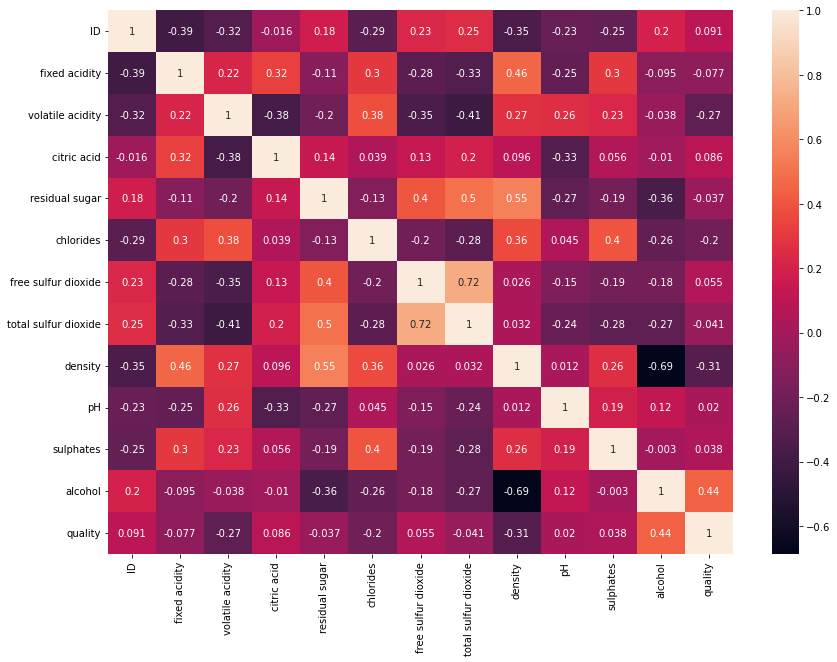

In [22]:
plt.figure(figsize=(14,10))
sns.heatmap(vinho.corr(), annot=True)

#### nota3: percebe-se correlações fortes entre QUALIDADE e as características abaixo, mostrado respectivamente :
####            alcohol, citric acid, free sulfur dioxide, sulphates, pH, volatile acidity...

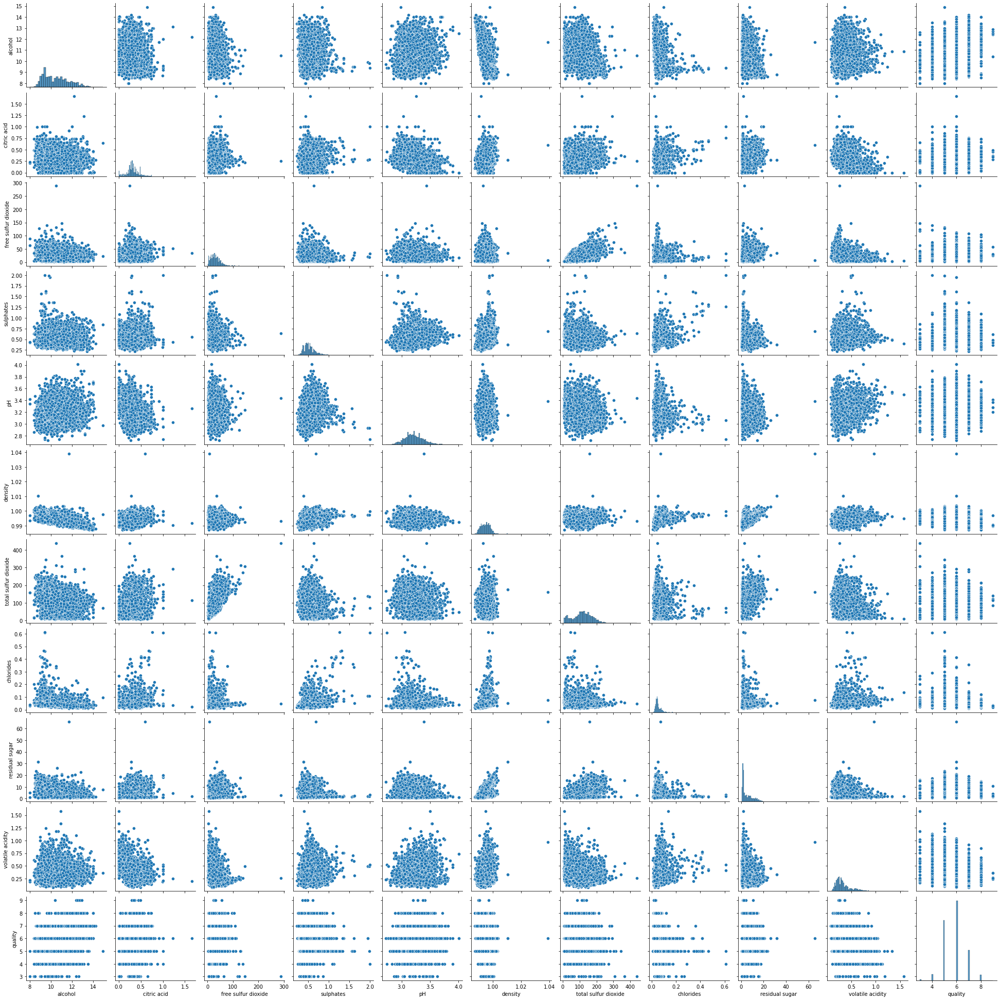

In [23]:
# Features numéricas
sns.pairplot(data=vinho[[ 'alcohol', 'citric acid', 'free sulfur dioxide', 'sulphates', 'pH', 'density',
                      'total sulfur dioxide', 'chlorides', 'residual sugar', 'volatile acidity' ,'quality']])

#### Calculando a correlação entre as principais features

a. alcohol & pH

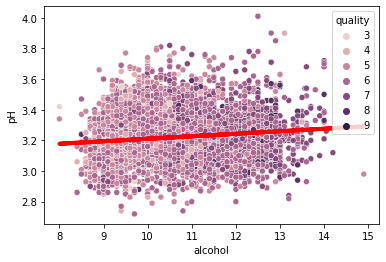

In [24]:
x = vinho['alcohol']
y = vinho['pH']

x_mean = x.mean()
y_mean = y.mean()

x_mean, y_mean

b1 = sum( (x - x_mean) * (y - y_mean) ) / sum( (x - x_mean)**2 )
b1 # coeficiente angular da reta

b0 = y_mean - (b1 * x_mean)
b0 # coeficiente linear (intercept)

# gráfico de correlação
sns.scatterplot(data=vinho, x='alcohol', y='pH', hue='quality')
plt.plot(x, b0 + b1 * x, color='red', linewidth=4)

#### análise baseado na reta de correlação entre pH e alcohol
##### pH entre 3.1 e 3.3 ==> considerado pH na média
##### teor de alcohol entre 9 e 13.5 ==> considerado teor de alcohol médio
##### na avaliação de qualidade, nota-se que os vinhos de maior qualidade encontram-se ACIMA da média do pH (3.1 e 3.3) e 
##### acima de 11 de teor de alcohol

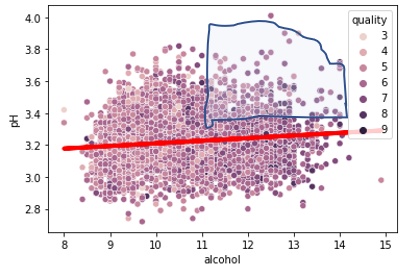

b. alcohol & free sulfur dioxide

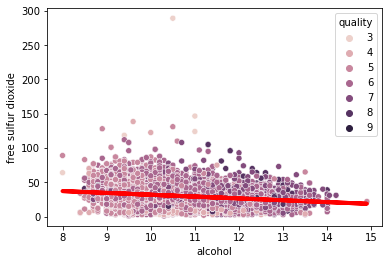

In [25]:
x = vinho['alcohol']
y = vinho['free sulfur dioxide']

x_mean = x.mean()
y_mean = y.mean()

x_mean, y_mean

b1 = sum( (x - x_mean) * (y - y_mean) ) / sum( (x - x_mean)**2 )
b1 # coeficiente angular da reta

b0 = y_mean - (b1 * x_mean)
b0 # coeficiente linear (intercept)

# gráfico de correlação
sns.scatterplot(data=vinho, x='alcohol', y='free sulfur dioxide', hue='quality')
plt.plot(x, b0 + b1 * x, color='red', linewidth=4)

#### análise baseado na reta de correlação entre free sulfur dioxide e alcohol
##### free sulfur dioxide entre 20 e 35 ==> considerado free sulfur dioxide na média
##### teor de alcohol entre 9 e 13.5 ==> considerado teor de alcohol médio
##### na avaliação de qualidade, nota-se que os vinhos de maior qualidade encontram-se ACIMA da média do free sulfur dioxide
##### (20 e 35) e acima de 10.5 de teor de alcohol

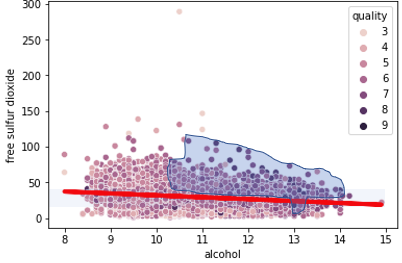

CONCLUSÃO: Este tipo de estudo é importante para o empreendedor e estudioso que queira analisar as correlações item a item
com suas 55 combinações. Para o nosso caso, não será necessário essa análise.

#### Portanto, para o nosso objetivo, melhor é estudar a correlação entre o parâmetro Quality (TARGET) e os 11 demais itens:

<AxesSubplot:xlabel='quality', ylabel='citric acid'>

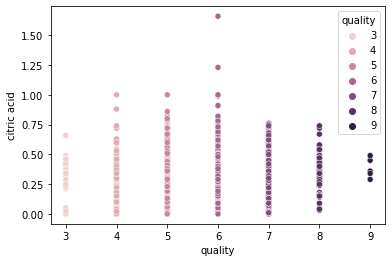

In [26]:
# 1. citric acid & quality
sns.scatterplot(data=vinho, x='quality', y='citric acid', hue='quality')

##### 1. citric acid & quality
##### os vinhos NOTA 9 tem entre 0.3 e 0.5
##### os demais vinhos tem grande concentração entre 0.10 e 0.75
##### valor desejável: de 0.10 a 0.75

<AxesSubplot:xlabel='quality', ylabel='fixed acidity'>

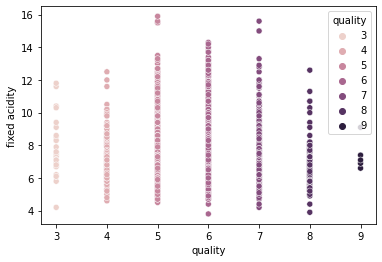

In [27]:
# 2. fixed acidity & quality
sns.scatterplot(data=vinho, x='quality', y='fixed acidity', hue='quality')

##### 2. fixed acidity & quality
##### os vinhos NOTA 9 tem entre 6.5 e 9 de fixed acidity
##### os demais vinhos tem grande concentração entre 4 e 13
##### valor desejável: de 5 a 13

<AxesSubplot:xlabel='quality', ylabel='volatile acidity'>

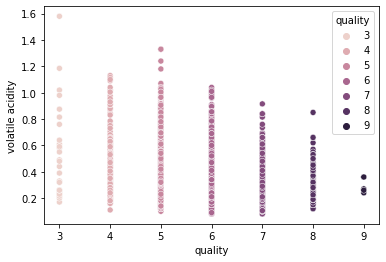

In [28]:
# 3. volatile acidity & quality
sns.scatterplot(data=vinho, x='quality', y='volatile acidity', hue='quality')

##### 3. volatile acidity & quality
##### os vinhos NOTA 9 tem entre 0.3 e 0.4 de volatile acidity
##### os demais vinhos tem grande concentração entre 0.1 e 0.7
##### valor desejável: de 0.1 a 0.7

<AxesSubplot:xlabel='quality', ylabel='residual sugar'>

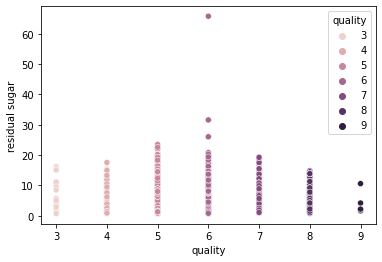

In [29]:
# 4. residual sugar & quality
sns.scatterplot(data=vinho, x='quality', y='residual sugar', hue='quality')

##### 4. residual sugar & quality
##### os vinhos NOTA 9 tem entre 2 e 10 de residual sugar
##### os demais vinhos tem grande concentração entre 1 e 18
##### valor desejável: de 1 a 18

<AxesSubplot:xlabel='quality', ylabel='chlorides'>

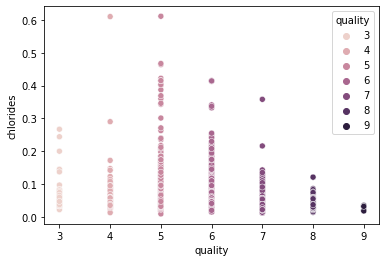

In [30]:
# 5. chlorides & quality
sns.scatterplot(data=vinho, x='quality', y='chlorides', hue='quality')

##### 5. chlorides & quality
##### os vinhos NOTA 9 tem entre 0 e 0.05 de chlorides
##### os vinhos NOTA 8 e 7 tem entre 0 e 0.15 de chlorides (tirando os outliers)
##### os vinhos NOTA 6 tem entre 0 e 0.28 de chlorides (tirando os outliers)
##### os vinhos NOTA 5 tem entre 0 e 0.45 de chlorides (tirando os outliers)
##### os vinhos NOTA 4 e 3 diminuem a qtde e tem entre 0 e 0.18 de chlorides (tirando os outliers)
##### vemos que essa característica NÃO AFETA na qualidade do vinho desde que obedeça o valor desejado
##### valor desejável: de 0 a 0.4

<AxesSubplot:xlabel='quality', ylabel='free sulfur dioxide'>

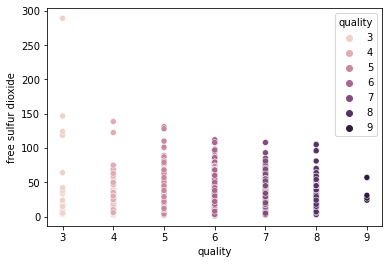

In [31]:
# 6. free sulfur dioxide & quality
sns.scatterplot(data=vinho, x='quality', y='free sulfur dioxide', hue='quality')

##### 6. free sulfur dioxide & quality
##### os vinhos NOTA 9 tem entre 25 e 60 de free sulfur dioxide
##### os demais vinhos tem grande concentração entre 5 e 110
##### valor desejável: de 5 a 110

<AxesSubplot:xlabel='quality', ylabel='total sulfur dioxide'>

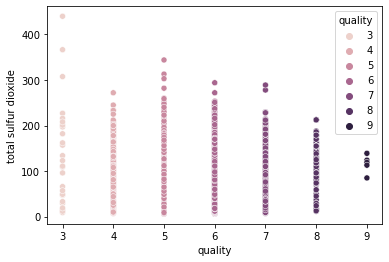

In [32]:
# 7. total sulfur dioxide & quality
sns.scatterplot(data=vinho, x='quality', y='total sulfur dioxide', hue='quality')

##### 7. total sulfur dioxide & quality
##### os vinhos NOTA 9 tem entre 90 e 130 de total sulfur dioxide
##### os demais vinhos tem grande concentração entre 10 e 300
##### valor desejável: de 10 a 300

<AxesSubplot:xlabel='quality', ylabel='density'>

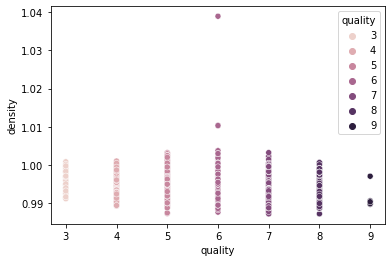

In [33]:
# 8. density & quality
sns.scatterplot(data=vinho, x='quality', y='density', hue='quality')

##### 8. density & quality
##### os vinhos NOTA 9 tem entre 0.990 e 0.998 de total density
##### os demais vinhos tem grande concentração entre 0.985 e 1.009
##### valor desejável: de 0.985 a 1.009

<AxesSubplot:xlabel='quality', ylabel='pH'>

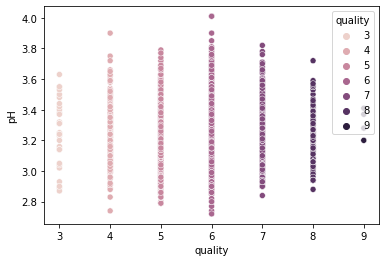

In [34]:
# 9. pH & quality
sns.scatterplot(data=vinho, x='quality', y='pH', hue='quality')

##### 9. pH & quality
##### os vinhos NOTA 9 tem entre 3.2 e 3.4 de pH
##### os demais vinhos tem grande concentração entre 2.9 e 3.65
##### valor desejável: de 2.9 a 3.65

<AxesSubplot:xlabel='quality', ylabel='sulphates'>

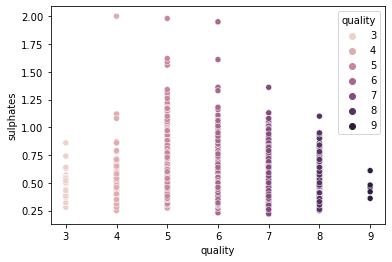

In [35]:
# 10. sulphates & quality
sns.scatterplot(data=vinho, x='quality', y='sulphates', hue='quality')

##### 10. sulphates & quality
##### os vinhos NOTA 9 tem entre 0.30 e 0.60 de sulphates
##### os demais vinhos tem grande concentração entre 0.25 e 1.10
##### valor desejável: de 0.25 a 1.10

<AxesSubplot:xlabel='quality', ylabel='alcohol'>

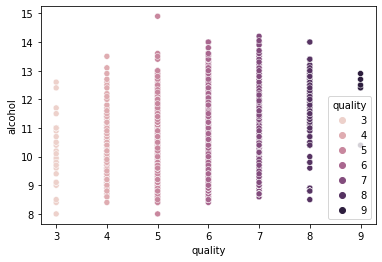

In [36]:
# 11. alcohol & quality
sns.scatterplot(data=vinho, x='quality', y='alcohol', hue='quality')

##### 11. alcohol & quality
##### os vinhos NOTA 9 tem entre 10.5 e 13 de alcohol
##### os demais vinhos tem grande concentração entre 8.5 e 13.5
##### valor desejável: de 8.5 a 13.5


#### nota4 : chegamos à conclusões interessantes sobre os vinhos contidos no dataframe 'vinhos' e conseguimos
#### identificar os níveis máximos e mínimos de cada característica para os vinhos de Nota 9 e 
#### para os demais vinhos, encontramos 'valores desejáveis'. A princípio é um bom resultado dos nossos estudos até aqui 

#### Limpeza da base e outliers :
#### Agora vamos tratar de outliers, que são dados que fogem muito do nosso padrão e que por conta disso acabam dificultando #### o processo de generalização do modelo de predição.
#### O primeiro passo para saber se um dado é ou não um outlier é o bom senso, mas não vamos por aí, afinal não conheço #### tanto de vinho assim...
#### A segunda forma de detectarmos outliers é através de métodos estatísticos.

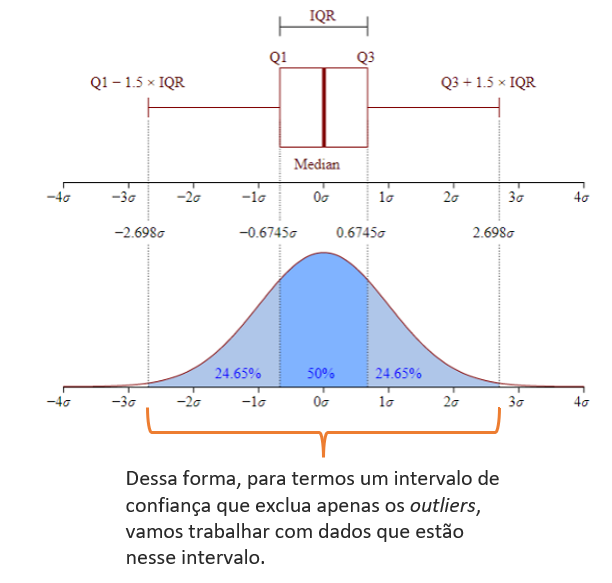

In [37]:
# tirar campos que não interessam, como o ID
vinho2 = vinho.drop(['ID'], axis = 1)

<AxesSubplot:>

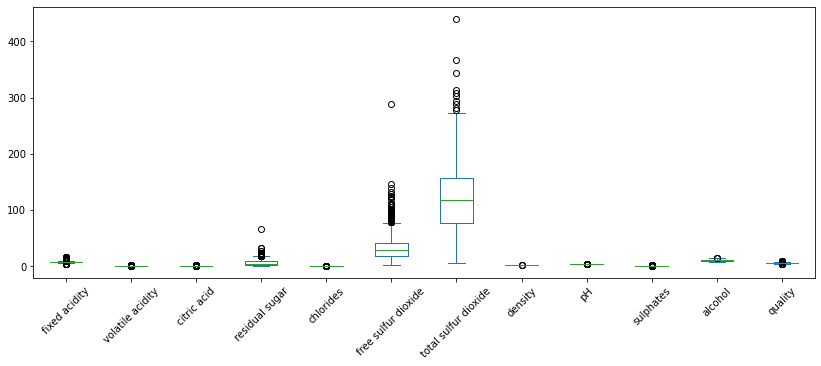

In [38]:
# outliers
vinho2.plot(kind='box',figsize=(14,5),rot=45)

#### excluir outliers

In [72]:
var = 'fixed acidity'
# ls : Limite Superior
IQR = vinho2[var].quantile(0.75) - vinho2[var].quantile(0.25)
ls = vinho2[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho2[vinho2[var] < ls]

In [73]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [74]:
var = 'volatile acidity'
# ls : Limite Superior
IQR = vinho2[var].quantile(0.75) - vinho2[var].quantile(0.25)
ls = vinho2[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

In [75]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
10,6.7,0.58,0.08,1.8,0.097,15.0,65.0,0.99590,3.28,0.54,9.2,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [62]:
var = 'citric acid'
# ls : Limite Superior
IQR = vinho2[var].quantile(0.75) - vinho2[var].quantile(0.25)
ls = vinho2[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

In [76]:
var = 'residual sugar'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'chlorides'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'free sulfur dioxide'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'total sulfur dioxide'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'density'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'pH'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'sulphates'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

var = 'alcohol'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho3 = vinho3[vinho3[var] < ls]

In [77]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


<AxesSubplot:>

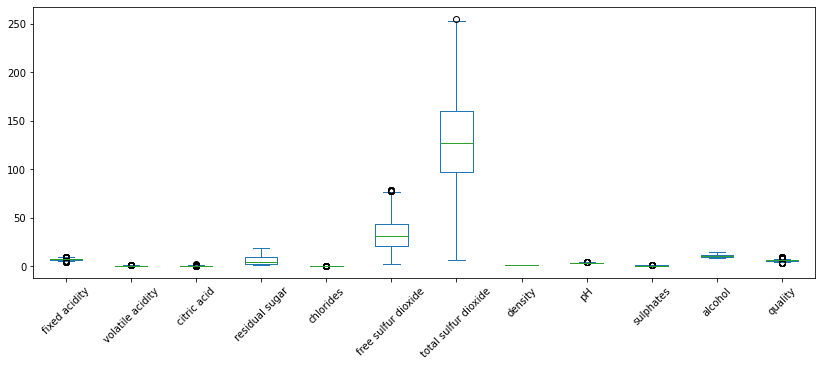

In [78]:
# outliers TRATADOS
vinho3.plot(kind='box',figsize=(14,5),rot=45)

#### nova análise dos itens sem os 4 principais outliers

<AxesSubplot:xlabel='quality', ylabel='residual sugar'>

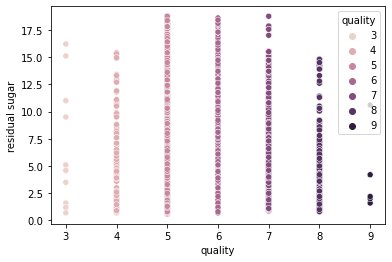

In [79]:
# 4.v2 residual sugar & quality
sns.scatterplot(data=vinho3, x='quality', y='residual sugar', hue='quality')

##### 4.v2 residual sugar & quality
##### os vinhos NOTA 9 tem entre 2 e 10 de residual sugar
##### os demais vinhos tem grande concentração entre 1 e 17.5
##### valor desejável: de 1 a 17.5

<AxesSubplot:xlabel='quality', ylabel='fixed acidity'>

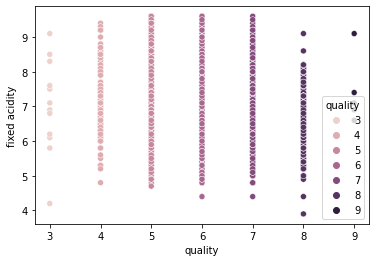

In [80]:
# 2.v2 fixed acidity & quality
sns.scatterplot(data=vinho3, x='quality', y='fixed acidity', hue='quality')

#### 2.v2 fixed acidity & quality
#### os vinhos NOTA 9 tem entre 6.5 e 9 de fixed acidity
#### os vinhos NOTA 8 tem entre 5 e 9.5 de fixed acidity
#### os demais vinhos tem grande concentração entre 3 e 10
#### valor desejável: de 5 a 10

<AxesSubplot:xlabel='quality', ylabel='free sulfur dioxide'>

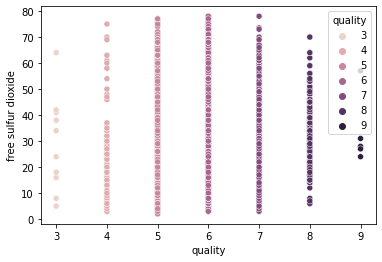

In [81]:
# 6.v2 free sulfur dioxide & quality
sns.scatterplot(data=vinho3, x='quality', y='free sulfur dioxide', hue='quality')

##### 6.v2 free sulfur dioxide & quality
##### os vinhos NOTA 9 tem entre 25 e 55 de free sulfur dioxide
##### os demais vinhos tem grande concentração entre 5 e 70
##### valor desejável: de 5 a 70

<AxesSubplot:xlabel='quality', ylabel='total sulfur dioxide'>

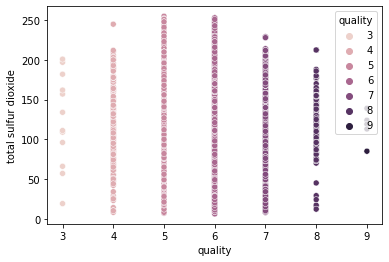

In [82]:
# 7.v2 total sulfur dioxide & quality
sns.scatterplot(data=vinho3, x='quality', y='total sulfur dioxide', hue='quality')

##### 7. total sulfur dioxide & quality
##### os vinhos NOTA 9 tem entre 90 e 130 de total sulfur dioxide
##### os demais vinhos tem grande concentração entre 10 e 220
##### valor desejável: de 10 a 200

#### nota5 : verifica-se que ao retirar os outliers chegamos a novos valores, mais apurados, para o campo 'valor desejável'

### FIM DA ETAPA 1 - ANÁLISE EXPLORATÓRIA DE DADOS

### ETAPA 2 - REGRESSÃO LINEAR

- Criação do modelo

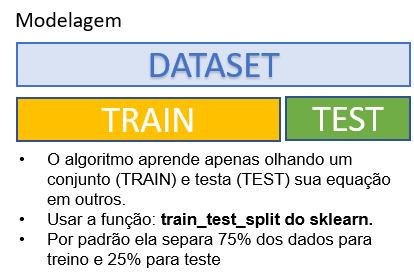

Com isto conseguimos calcular um valor de erro mais correto.

Separar o dados em base de treino e teste:
- **X :** todos os dados característicos fisico-químicos dos vinhos
- **y :** variável Quality.

In [83]:
X = vinho3[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
        'chlorides', 'free sulfur dioxide', 'total sulfur dioxide',
        'density', 'pH', 'sulphates', 'alcohol']] # características fisico-químico dos vinhos
y = vinho3['quality'] # target, classe, dependente ==> variável dependente Quality

In [84]:
# características do vinho
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5
...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8


In [85]:
# var objetivo que é a qualidade
y

6       5
7       7
8       7
9       5
11      5
       ..
6492    6
6493    5
6494    6
6495    7
6496    6
Name: quality, Length: 5075, dtype: int64

#### Separação da base ==> vamos separar em 70/30

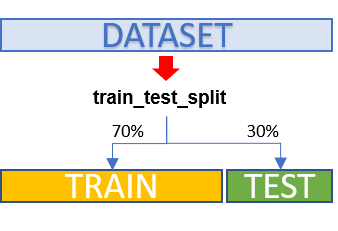

In [86]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)
# test_size: Define a porcentagem que será separada para a base de teste
# random_state: Seed de aleatoriadade, para garantir a reprodutibilidade.

In [87]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((3552, 11), (1523, 11), (3552,), (1523,))

Para o caso da Regressão Linear Múltipla, iremos utilizar a biblioteca do Scikit-Learn chamada [LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html?highlight=linearregression#sklearn.linear_model.LinearRegression):

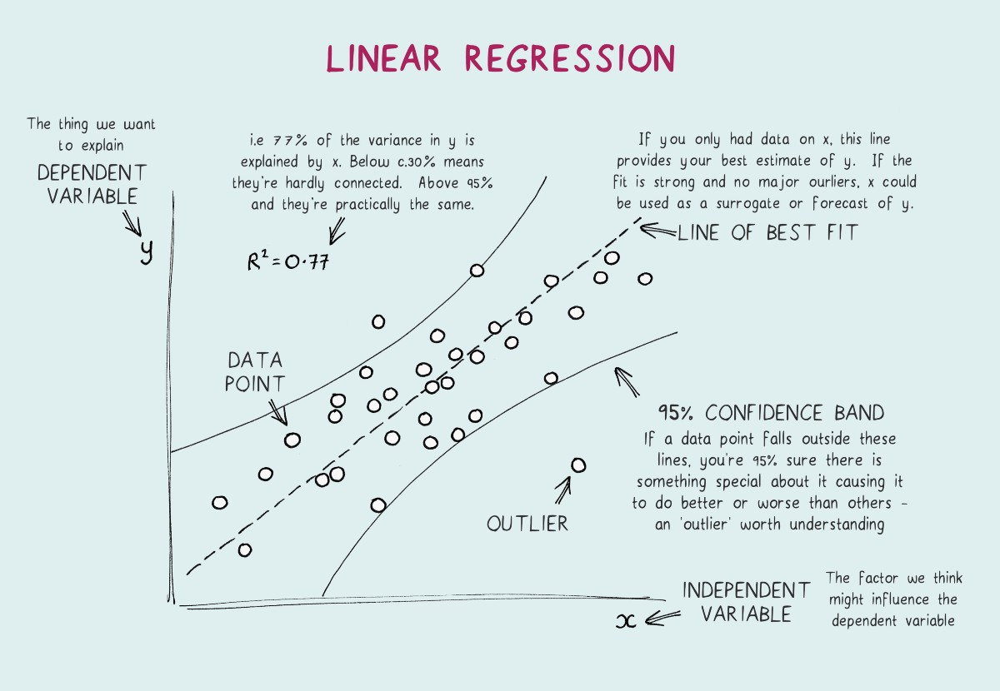

In [88]:
from sklearn.linear_model import LinearRegression

# Instancia o modelo
model = LinearRegression()  # model = lr = modelo = modelo_regressao

# Fit(ajuste) dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
model.fit(X_train, y_train)

LinearRegression()

In [89]:
# Testar o modelo treinado
# Para os dados novos, vamos definir a predição para a base de teste
y_pred = model.predict(X_test) # predizer o y ----> SÓ VOU USAR O X PARA DEPOIS COMPARAR O Y

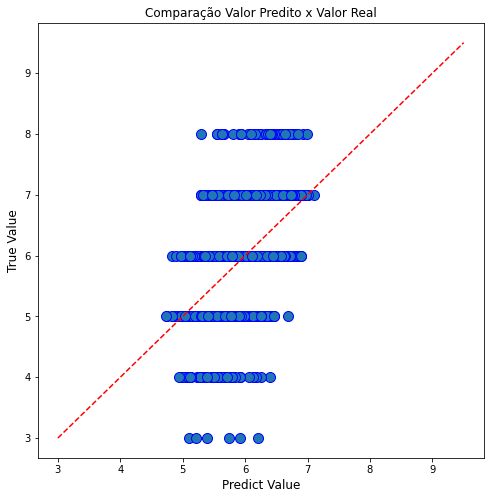

In [90]:
# Vamos criar um gráfico para comparar os Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))

l = plt.plot(y_pred, y_test, 'bo')


plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')

plt.show()

#### Avaliação do Modelo

In [91]:
from sklearn.metrics import r2_score
R2 = r2_score(y_test, y_pred)
print('R2:', R2)

R2: 0.27913304562468066


O modelo possui 27,9% de eficiência

In [92]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(y_test, y_pred)/y_test.mean()
mse = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean()**2)

In [93]:
mae

0.09752123527175396

In [94]:
mse

0.12551987663119638

Assim, penalizando os casos mais errados, nossa predição se desviou 12,55% da média

- normalizar/padronizar os dados (scaling)
    - padronização
    - normalização
    - min max
    
    Vamos deixar as variáveis na mesma escala

In [95]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(vinho3.drop(['quality'], axis = 1))

StandardScaler()

In [96]:
X = scaler.transform(vinho3.drop(['quality'], axis = 1))
y = vinho3['quality'] # target, classe, dependente

In [97]:
# dados padronizados
scaler.transform(vinho3.drop(['quality'], axis = 1))

array([[ 1.14962956,  2.68020167, -2.1203788 , ...,  0.6150846 ,
        -0.34759543, -0.94551502],
       [ 0.44195426,  3.12121869, -2.6092783 , ...,  1.21635994,
        -0.25770769, -0.44988416],
       [ 1.03168367,  2.50379486, -2.4463118 , ...,  1.01593482,
         0.64116966, -0.86290988],
       ...,
       [-0.5016128 , -0.49512091, -1.06109655, ..., -1.45597491,
        -0.34759543, -0.94551502],
       [-1.68107162, -0.05410388, -0.16478081, ...,  0.88231808,
        -1.06669731,  1.86305986],
       [-1.09134221, -0.75973112,  0.48708519, ...,  0.34785111,
        -1.60602372,  1.03700843]])

In [98]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [99]:
from sklearn.linear_model import LinearRegression

# Instancia o modelo
model = LinearRegression()  #modelo, model, lr, linreg

# Fit(ajuste) dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
model.fit(X_train, y_train)

LinearRegression()

In [100]:
# Para os dados novos, vamos definir a predição para a base de teste
y_pred = model.predict(X_test)

In [101]:
from sklearn.metrics import r2_score
R2 = r2_score(y_test, y_pred)
print('R2:', R2)

R2: 0.27913304562467967


#### nota 6 : percebemos que o R² não se altera com a operação de normalização de escala 

In [102]:
coefs = model.coef_

list_columns = vinho3.drop(['quality'], axis = 1).columns
list_feature = []
list_score = []

for i, v in enumerate(coefs):
    list_feature.append(list_columns[i])
    list_score.append(v)

dictionary = {'Features': list_feature,
              'Scores': list_score}

df_features = pd.DataFrame(dictionary)
df_features = df_features.sort_values(by=['Scores'], ascending=False)
df_features.reset_index(inplace=True, drop=True)
#df_features.head(10)
df_features

,Features,Scores
0,alcohol,0.303589
1,residual sugar,0.247669
2,free sulfur dioxide,0.135143
3,pH,0.100007
4,sulphates,0.078356
5,fixed acidity,0.071686
6,chlorides,-0.009940
7,citric acid,-0.036728
8,total sulfur dioxide,-0.120359
9,volatile acidity,-0.156945


<AxesSubplot:xlabel='Scores', ylabel='Features'>

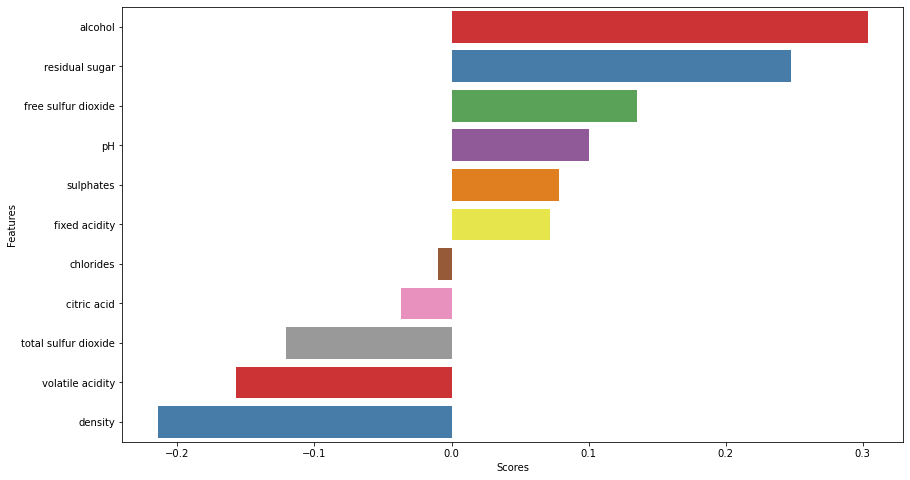

In [104]:
plt.figure(figsize=(14,8))
sns.barplot(x='Scores', y='Features', data=df_features, palette='Set1')

##### Variáveis mais importantes são: 
#### alcohol, residual sugar, density, volatile acidity, total sulfur dioxide, free sulfur dioxide, pH, sulphates e fixed acidity, nessa ordem.

#### Para ´limpar´ nossa base, ainda poderíamos eliminar as 2 variáveis menos influentes:
#### chlorides e citric acid

#### Importante ==> A NORMALIZAÇÃO
#### vejam abaixo a imagem mostrando o mesmo estudo antes do tratamento de escala

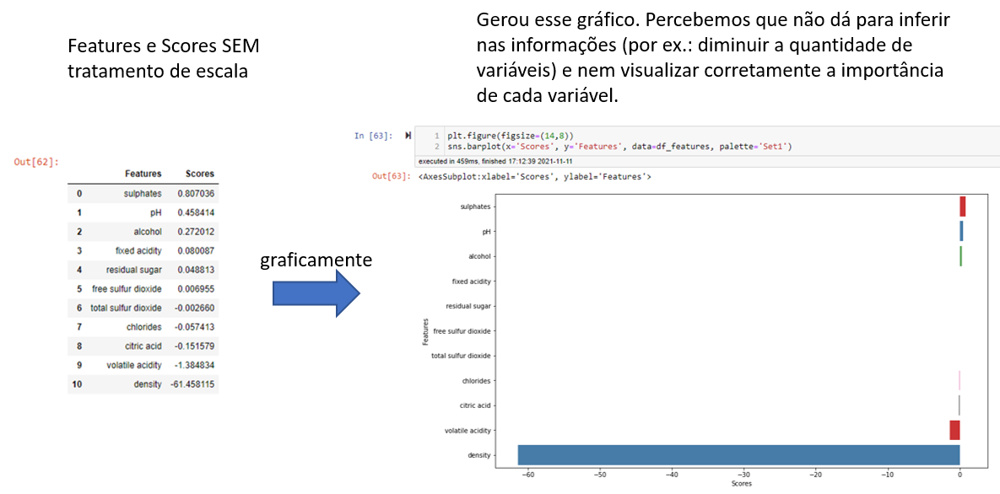

#### RESÍDUOS

1. Não devem ser correlacionados
2. Ter média zero
3. Distribuição normal dos resíduos

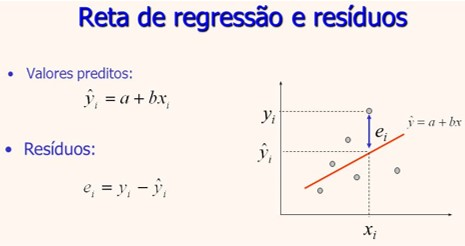

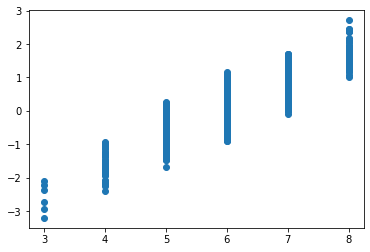

In [105]:
residuos = y_test - y_pred
plt.scatter(y_test, residuos)

#### Interpretação: 
Os resíduos indicam a variação natural dos dados, um fator aleatório (ou não) que o modelo não capturou.
Se as pressuposições do modelo são violadas, a análise será levada a resultados duvidosos e não confiáveis
para inferência.

In [106]:
residuos.mean()

-0.019502472953595796

In [107]:
from scipy.stats import normaltest
normaltest(residuos)

NormaltestResult(statistic=33.01499500860169, pvalue=6.774619749472288e-08)

<AxesSubplot:xlabel='quality', ylabel='Count'>

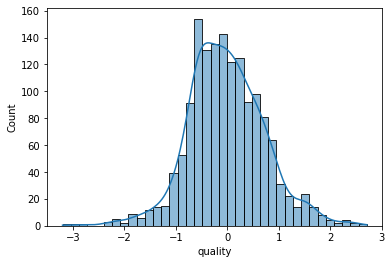

In [108]:
sns.histplot(residuos, kde=True)

In [109]:
import statsmodels.api as sm

model = sm.OLS(y_train, X_train)
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                quality   R-squared (uncentered):                   0.008
Model:                            OLS   Adj. R-squared (uncentered):              0.005
Method:                 Least Squares   F-statistic:                              2.509
Date:                Sat, 20 Nov 2021   Prob (F-statistic):                     0.00383
Time:                        23:41:37   Log-Likelihood:                         -11362.
No. Observations:                3552   AIC:                                  2.275e+04
Df Residuals:                    3541   BIC:                                  2.281e+04
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

### FIM DA ETAPA 2 - REGRESSÃO LINEAR
_ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _   

### INÍCIO ETAPA 3 - REGRESSÃO LOGÍSTICA

In [110]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,  precision_score, recall_score, f1_score, classification_report

In [111]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [113]:
# criar coluna status ==> 1 = Bom, 0 = Ruim
vinho3['status'] = np.where(vinho3['quality'] >=6, 1, 0)

In [114]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,status
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4,5,0
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0,7,1
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5,7,1
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,0
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


#### Análise Univariada

In [115]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

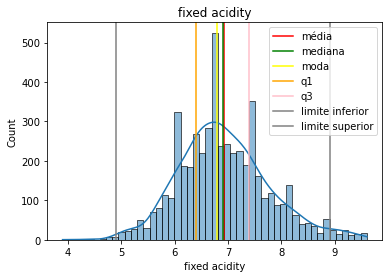

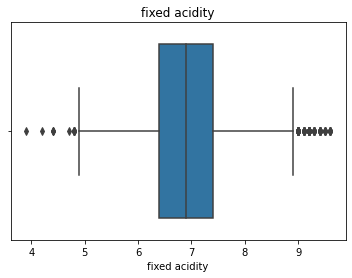

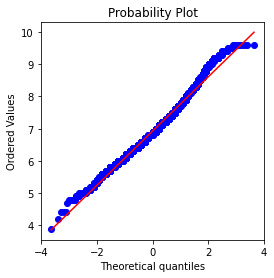

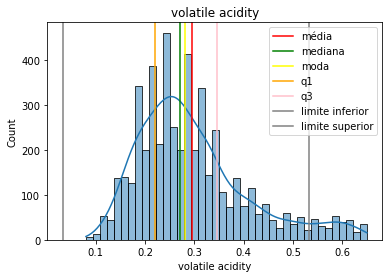

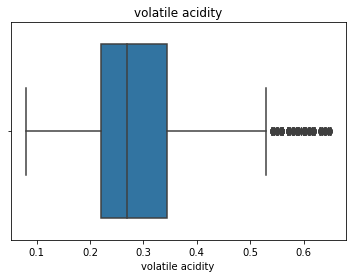

...

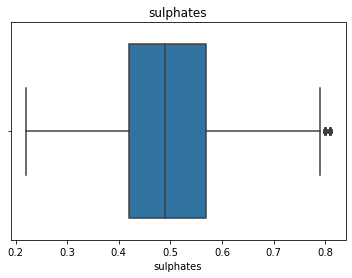

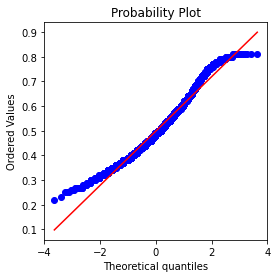

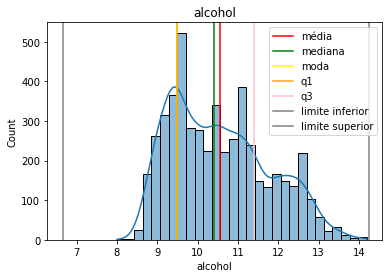

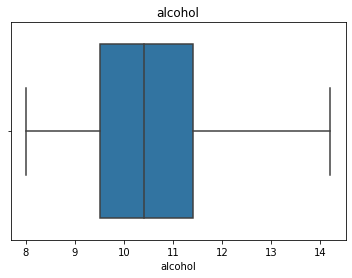

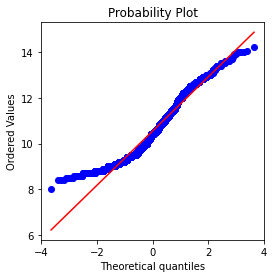

In [116]:
for item in ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide',
             'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']:
    sns.histplot(vinho3[item], kde=True)
    # plotando média
    plt.axvline(x=vinho3[item].mean(), color="red", label="média")

    # plotando a mediana
    plt.axvline(vinho3[item].median(), color="green", label="mediana")

    # Loop para plotar as modas
    for i in range(vinho3[item].mode().shape[0]):
        plt.axvline(vinho3[item].mode()[i], color="yellow", label="moda")

    plt.axvline(vinho3[item].quantile(0.25), color="orange", label="q1")
    plt.axvline(vinho3[item].quantile(0.75), color="pink", label="q3")

    IQR = vinho3[item].quantile(0.75) - vinho3[item].quantile(0.25)
    plt.axvline(vinho3[item].quantile(0.25)-1.5 * IQR, color="grey", label="limite inferior")
    plt.axvline(vinho3[item].quantile(0.75)+1.5 * IQR, color="grey", label="limite superior")

    plt.legend()

    plt.title(item)
    plt.show()
    plt.title(item)
    sns.boxplot(vinho3[item])
    plt.show()
    
    from scipy import stats
    fig, ax = plt.subplots(figsize=(4, 4))

    stats.probplot(vinho3[item], plot=ax)
    plt.show()


#### Identificado outliers em : ==> fixed acidity ( + e - ), volatile acidity ( + ), citric acid (+ e -), free sulfur dioxide ( + ) e sulphates ( + ) 

#### EXCLUINDO OS OUTLIERS novamente e criando novo Dataset = vinho4

In [117]:
vinho3

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,status
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.99640,3.30,0.46,9.4,5,0
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.99460,3.39,0.47,10.0,7,1
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.99680,3.36,0.57,9.5,7,1
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,0
11,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


In [125]:
var = 'fixed acidity'
# ls : Limite Superior
IQR = vinho3[var].quantile(0.75) - vinho3[var].quantile(0.25)
ls = vinho3[var].quantile(0.75) + 1.5*IQR
vinho4 = vinho3[vinho3[var] < ls]
# li : Limite Inferior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
li = vinho4[var].quantile(0.25) - 1.5*IQR
vinho4 = vinho4[vinho4[var] > li]

var = 'volatile acidity'
# ls : Limite Superior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
ls = vinho4[var].quantile(0.75) + 1.5*IQR
vinho4 = vinho4[vinho4[var] < ls]

var = 'citric acid'
# ls : Limite Superior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
ls = vinho4[var].quantile(0.75) + 1.5*IQR
vinho4 = vinho4[vinho4[var] < ls]
# li : Limite Inferior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
li = vinho4[var].quantile(0.25) - 1.5*IQR
vinho4 = vinho4[vinho4[var] > li]

var = 'free sulfur dioxide'
# ls : Limite Superior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
ls = vinho4[var].quantile(0.75) + 1.5*IQR
vinho4 = vinho4[vinho4[var] < ls]

var = 'sulphates'
# ls : Limite Superior
IQR = vinho4[var].quantile(0.75) - vinho4[var].quantile(0.25)
ls = vinho4[var].quantile(0.75) + 1.5*IQR
vinho4 = vinho4[vinho4[var] < ls]

In [126]:
vinho4

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,status
21,7.6,0.39,0.31,2.3,0.082,23.0,71.0,0.99820,3.52,0.65,9.7,5,0
23,8.5,0.49,0.11,2.3,0.084,9.0,67.0,0.99680,3.17,0.53,9.4,5,0
25,6.3,0.39,0.16,1.4,0.080,11.0,23.0,0.99550,3.34,0.56,9.3,5,0
26,7.6,0.41,0.24,1.8,0.080,4.0,11.0,0.99620,3.28,0.59,9.5,5,0
37,8.1,0.38,0.28,2.1,0.066,13.0,30.0,0.99680,3.23,0.73,9.7,7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


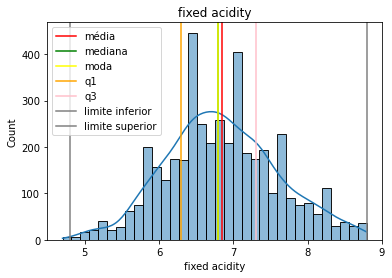

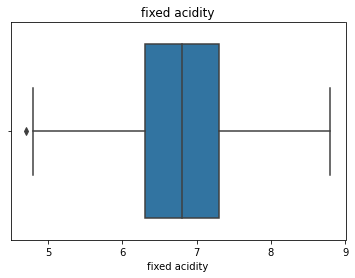

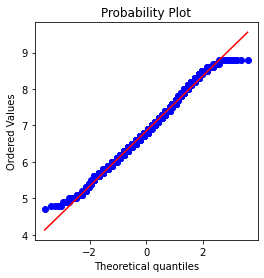

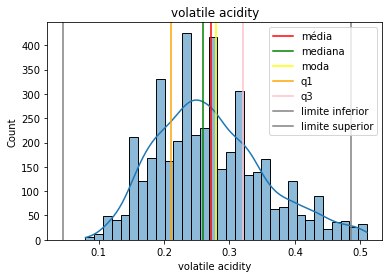

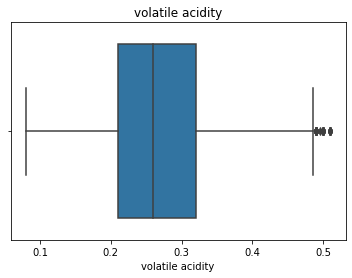

...

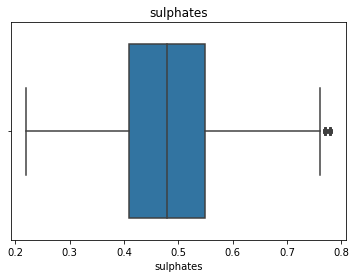

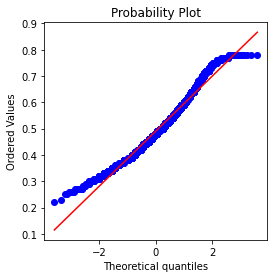

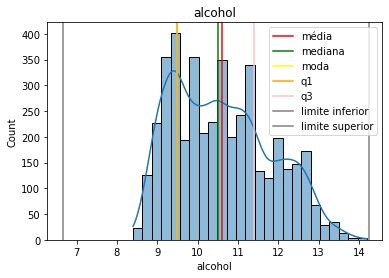

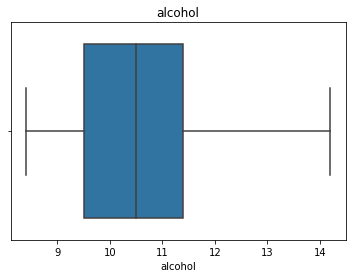

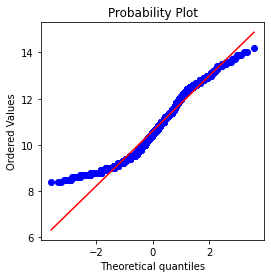

In [127]:
for item in ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide',
             'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']:
    sns.histplot(vinho4[item], kde=True)
    # plotando média
    plt.axvline(x=vinho4[item].mean(), color="red", label="média")

    # plotando a mediana
    plt.axvline(vinho4[item].median(), color="green", label="mediana")

    # Loop para plotar as modas
    for i in range(vinho4[item].mode().shape[0]):
        plt.axvline(vinho4[item].mode()[i], color="yellow", label="moda")

    plt.axvline(vinho4[item].quantile(0.25), color="orange", label="q1")
    plt.axvline(vinho4[item].quantile(0.75), color="pink", label="q3")

    IQR = vinho4[item].quantile(0.75) - vinho4[item].quantile(0.25)
    plt.axvline(vinho4[item].quantile(0.25)-1.5 * IQR, color="grey", label="limite inferior")
    plt.axvline(vinho4[item].quantile(0.75)+1.5 * IQR, color="grey", label="limite superior")

    plt.legend()

    plt.title(item)
    plt.show()
    plt.title(item)
    sns.boxplot(vinho4[item])
    plt.show()
    
    from scipy import stats
    fig, ax = plt.subplots(figsize=(4, 4))

    stats.probplot(vinho4[item], plot=ax)
    plt.show()


In [131]:
#### nota 6: Dataset criado após a limpeza completa, tanto do lado positivo quanto do lado negativo
#### comparação de tamanhos ==> df_vinho3 : 5075 linhas, df_vinho4: 4304 linhas


#### Análise multivariada

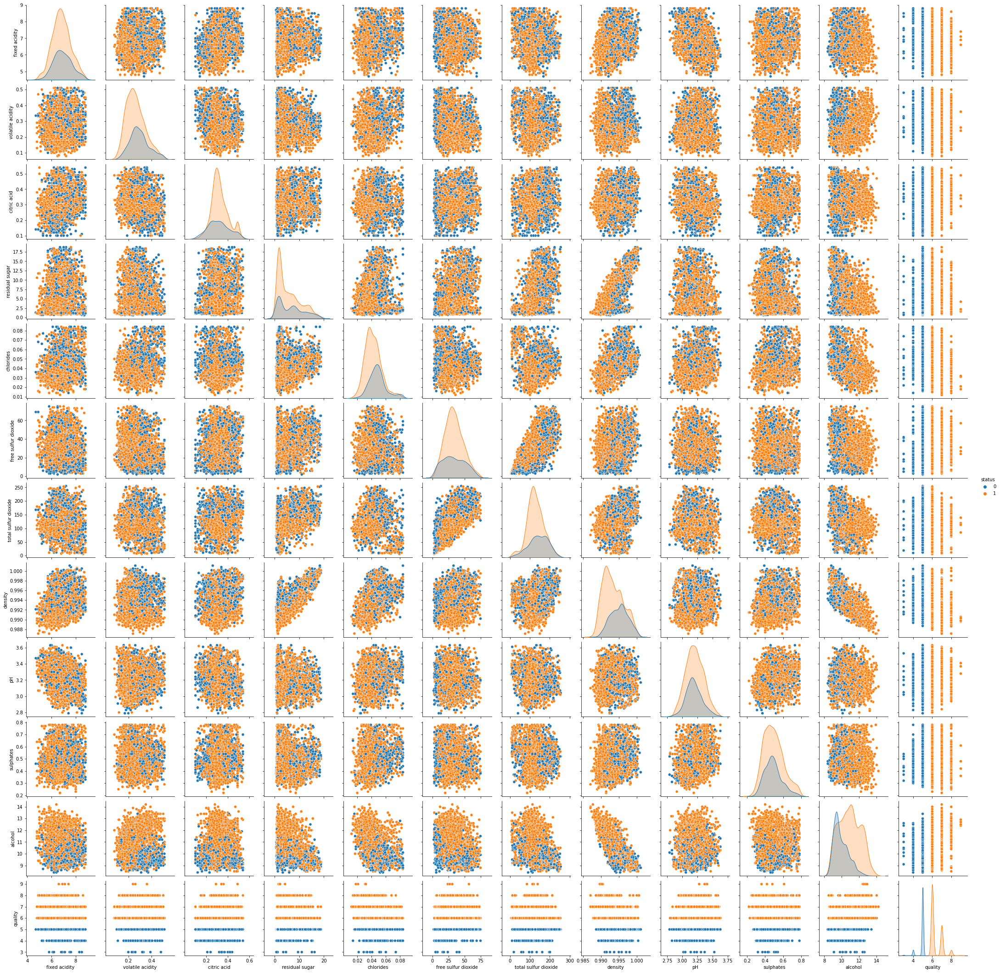

In [129]:
# Plot do pairplot
sns.pairplot(vinho4, hue='status')

# Mostra o gráfico
plt.show()

In [132]:
vinho4.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,status
fixed acidity,1.000000,0.026427,0.250252,0.031908,0.176574,-0.080820,-0.019828,0.253794,-0.322594,0.053430,-0.085068,-0.060968,-0.062349
volatile acidity,0.026427,1.000000,-0.159556,-0.002769,0.165017,-0.136501,-0.044642,0.042819,0.051987,0.069558,0.089324,-0.129008,-0.178754
citric acid,0.250252,-0.159556,1.000000,0.017215,-0.019469,0.086903,0.093563,0.039490,-0.101756,0.059588,0.025922,0.040979,0.041697
residual sugar,0.031908,-0.002769,0.017215,1.000000,0.138363,0.373473,0.438019,0.778427,-0.215037,-0.088250,-0.464023,-0.091850,-0.092652
chlorides,0.176574,0.165017,-0.019469,0.138363,1.000000,0.010874,0.054731,0.506427,0.109729,0.188386,-0.468097,-0.271188,-0.233538
free sulfur dioxide,-0.080820,-0.136501,0.086903,0.373473,0.010874,1.000000,0.647896,0.278981,-0.070319,-0.022408,-0.248804,0.020857,0.002611
total sulfur dioxide,-0.019828,-0.044642,0.093563,0.438019,0.054731,0.647896,1.000000,0.411314,-0.100533,-0.015951,-0.412515,-0.141850,-0.145630
density,0.253794,0.042819,0.039490,0.778427,0.506427,0.278981,0.411314,1.000000,-0.006482,0.123853,-0.807210,-0.308046,-0.277976
pH,-0.322594,0.051987,-0.101756,-0.215037,0.109729,-0.070319,-0.100533,-0.006482,1.000000,0.202785,0.064339,0.046920,0.032980
sulphates,0.053430,0.069558,0.059588,-0.088250,0.188386,-0.022408,-0.015951,0.123853,0.202785,1.000000,-0.050267,0.019293,0.021699


<AxesSubplot:>

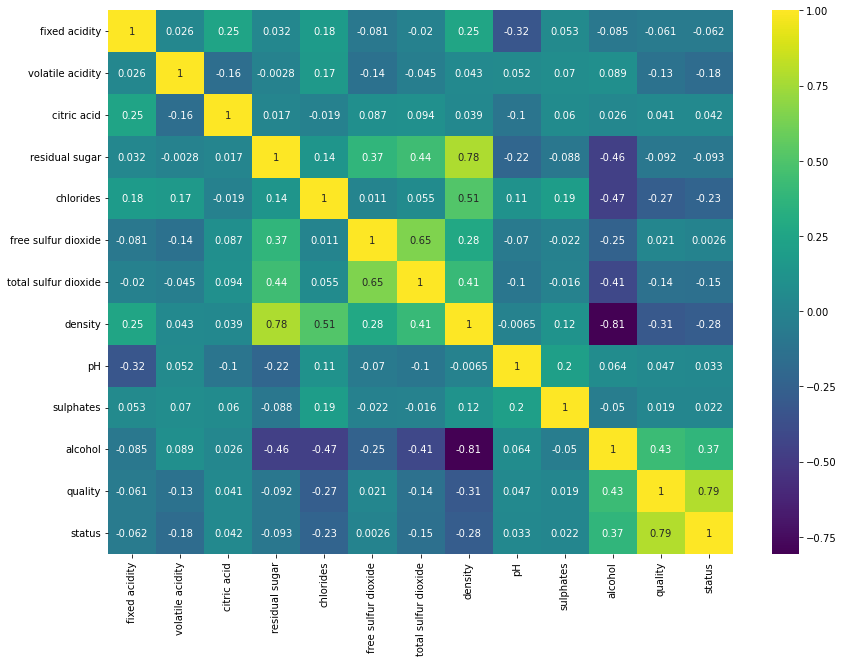

In [133]:
plt.figure(figsize=(14,10))
sns.heatmap(vinho4.corr(), annot=True, cmap='viridis')

#### podemos observar várias correlações entre o status (Bom ou Ruim) e as várias características

#### Modelo de Regressão Logística - Modelo de CLASSIFICAÇÃO

In [134]:
# Remove a coluna status e quality da base de features
X = vinho4.drop(['status', 'quality'], axis = 1)

# Separa a target
y = vinho4['status']

In [135]:
# Separa os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [136]:
# Instanciando o modelo
model = LogisticRegression()

In [137]:
from sklearn.linear_model import LogisticRegression
log_model = LogisticRegression(solver='lbfgs', max_iter=1000000)

In [138]:
# Fit do Modelo, ajustar o modelo
model.fit(X_train, y_train) # o modelo está treinado

LogisticRegression()

In [139]:
# Predições para a base de teste
y_pred = model.predict(X_test)
y_proba =  model.predict_proba(X_test)

In [140]:
y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [141]:
y_proba

array([[0.1763267 , 0.8236733 ],
       [0.11164793, 0.88835207],
       [0.42353576, 0.57646424],
       ...,
       [0.1225906 , 0.8774094 ],
       [0.21026409, 0.78973591],
       [0.05684786, 0.94315214]])

#### Avaliação do Modelo

In [142]:
# Classification Report dos Resultados
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.57      0.34      0.42       401
           1       0.75      0.88      0.81       891

    accuracy                           0.72      1292
   macro avg       0.66      0.61      0.62      1292
weighted avg       0.69      0.72      0.69      1292



#### Acurácia de 72%
#### f1-score para 0 (Ruim) = 42% e para 1(Bom) = 81%

#### Métrica de Avaliação

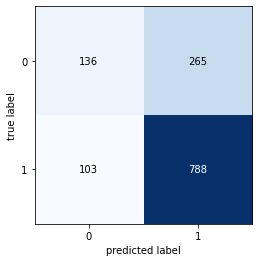

<Figure size 1008x1008 with 0 Axes>

In [148]:
# Define a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Cria o plot da matriz de confusão
plot_confusion_matrix(conf_mat=cm)

# Mostra o gráfico
plt.show()

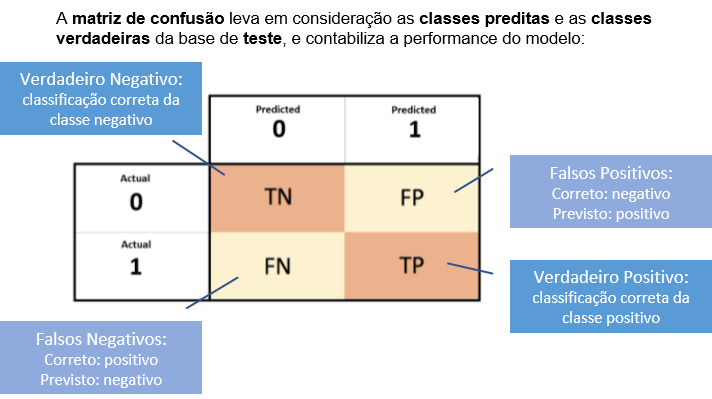

#### nota 7 : conforme o resultado do modelo acima, ele diz que: 
#### 788 amostras são TP, 103 são FN, 265 são FP e 136 são TN

### FIM